In [1]:
import sys
sys.path.insert(0, '../../stock_factor_lab/')

In [2]:
START_DATE = '2009-3-31'
END_DATE = '2024'

# 整理暑假的程式
比較新的版本
### 回測期間 - 2009 ~ 2024目前 

## import

In [3]:
from get_data import Data
import backtest
from combinations import sim_conditions
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.graph_objects as go
# import plotly.graph_objs as go
import plotly.express as px
from itertools import cycle
from plotly.subplots import make_subplots
from matplotlib import rcParams
rcParams['font.sans-serif'] = ['Microsoft JhengHei']
import matplotlib as mpl
mpl.rcParams['axes.unicode_minus'] = False
from matplotlib.ticker import FuncFormatter
import matplotlib.dates as mdates
from datetime import datetime

# from dataframe import CustomDataFrame

import plot_data

## get data

In [4]:
data=Data()

---

## 一些有的沒的畫圖 function

### 每年 TopN (學長的那個 + 股票代號label、print出前幾名 list)

In [5]:
def analyze_top_stocks(rep, topN):
    trades_df = rep.trades
    trades_df["cum_return"] = (1 + trades_df['return']).groupby(trades_df['stock_id']).cumprod() - 1
    trades_df = trades_df.groupby('stock_id').last().reset_index()

    trades_df['entry_date'] = pd.to_datetime(trades_df['entry_date'])
    trades_df['year'] = trades_df['entry_date'].dt.year

    grouped = trades_df.groupby(['year', 'stock_id'])['cum_return'].last().reset_index()

    def process_year_group(group):
        top_stocks = group.nlargest(topN, 'cum_return')
        other_total = group[~group['stock_id'].isin(top_stocks['stock_id'])]['cum_return'].sum()
        other_row = pd.DataFrame({'year': [group['year'].iloc[0]],
                                  'stock_id': ['其他'],
                                  'cum_return': [other_total]})
        return pd.concat([top_stocks, other_row], ignore_index=True)

    final_data = grouped.groupby('year').apply(process_year_group).reset_index(drop=True)

    top_stocks_by_year = {}

    for year in final_data['year'].unique():
        year_data = final_data[final_data['year'] == year]
        top_stocks = year_data[year_data['stock_id'] != '其他']['stock_id'].tolist()
        top_stocks_by_year[year] = top_stocks

    fig = go.Figure()

    other_data = final_data[final_data['stock_id'] == '其他']
    if not other_data.empty:
        fig.add_trace(go.Bar(
            x=other_data['year'],
            y=other_data['cum_return'],
            name='其他',
            marker=dict(
                color='white',
                pattern_shape="/"
            )
        ))

    for stock_id in final_data['stock_id'].unique():
        if stock_id != '其他':
            stock_data = final_data[final_data['stock_id'] == stock_id]
            fig.add_trace(go.Bar(
                x=stock_data['year'],
                y=stock_data['cum_return'],
                name=f'{stock_id}',
                text=stock_id,
                textposition='inside'
            ))

    fig.update_layout(
        barmode='stack',
        title=f'年度前{topN}高報酬所佔全部比例',
        xaxis=dict(title='年份'),
        yaxis=dict(title='累積回報'),
        legend_title="公司代號"
    )

    print(f"每年前 {topN} 高的股票代號：")
    for year, stocks in top_stocks_by_year.items():
        print(f"{year}: {stocks}")

    return fig, top_stocks_by_year, final_data


# # 使用範例
# fig, top_stocks_by_year, final_data = analyze_top_stocks(roe_value_collc_pe_4y15rep, 5)
# fig.show()

---

## 資料下載

### **盈餘再投資率**

In [6]:
profit = data.get('annual_report_fundamentals:常續性稅後淨利')

In [7]:
# 抓資料
long_term_items = [
    '透過損益按公允價值衡量之金融資產－非流動',
    '透過其他綜合損益按公允價值衡量之金融資產－非流動',
    '按攤銷後成本衡量之金融資產－非流動',
    '避險之金融資產－非流動',
    '合約資產－非流動',
    '採權益法之長期股權投資',
    '預付投資款',
    '投資性不動產淨額'
]

# 長期投資項目 (8個)
long_term_data = [data.get(f'annual_report_fundamentals:{item}').fillna(0) for item in long_term_items]
long_term_investment = sum(long_term_data)
# 固定資產
fixed_assets_year = data.get('annual_report_fundamentals:不動產廠房及設備').fillna(0)

In [8]:
# 計算盈再率分子
long_term_investment_df = (long_term_investment - long_term_investment.shift(4))['2000':].astype('int64')
fixed_assets_df = (fixed_assets_year - fixed_assets_year.shift(4))['2000':].astype('int64')

In [9]:
profit_rol_df = profit.rolling(4).sum()['2000':]

In [10]:
# 計算出盈再率
# 去掉淨利為負的公司 (當年度淨利為負、四年加總淨利為負都去掉)
rr = (long_term_investment_df + fixed_assets_df) / profit_rol_df
rr = rr[(profit > 0) & (profit_rol_df > 0)]

In [11]:
rr

company_symbol,1101,1102,1103,1104,1108,1109,1110,1201,1203,1210,...,9944,9945,9946,9949,9950,9951,9955,9958,9960,9962
2000-03-31,13.245582,0.815813,NaN,-0.595758,-0.602606,0.130315,1.140309,NaN,NaN,1.447513,...,1.593464,NaN,3.524881,0.226401,4.472557,3.697851,16.765896,-0.405779,NaN,8.054138
2001-03-31,NaN,0.787161,NaN,0.331709,NaN,0.495080,NaN,NaN,NaN,1.477136,...,1.175926,NaN,2.612950,0.276662,NaN,2.056450,2.783919,0.069697,NaN,3.192042
2002-03-31,NaN,1.057771,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.126422,...,0.951030,NaN,0.171435,0.274976,40.896197,1.307465,2.663067,NaN,NaN,-0.543037
2003-03-31,NaN,2.402836,NaN,27.003039,NaN,0.582927,18.892247,NaN,NaN,0.719334,...,0.960226,NaN,0.296872,0.304356,2.010342,0.488089,1.135314,NaN,NaN,-0.549853
2004-03-31,NaN,4.071002,0.454872,17.336626,NaN,0.689788,16.860777,NaN,NaN,0.846428,...,0.788665,NaN,0.096754,0.101170,-0.026981,0.375825,0.530105,NaN,0.259403,-0.465145
2005-03-31,1.061549,2.070673,0.552180,5.151004,NaN,-0.770317,1.100864,NaN,20.779871,-0.010606,...,0.648532,NaN,-0.027250,-0.044297,-0.386520,0.403769,0.370980,0.936592,0.105303,-0.190615
2006-03-31,-1.086303,1.208228,1.122982,0.273796,NaN,-0.625743,-0.278697,-0.515753,4.146777,-0.429598,...,0.369066,NaN,0.717121,-0.036121,-0.308903,0.378146,0.401738,0.388133,0.099235,-0.174807
2007-03-31,-0.883051,1.248040,1.246196,0.392781,-0.675487,-0.671147,0.026735,-0.656122,NaN,0.121807,...,0.105770,0.106287,0.812467,0.321042,-0.176948,0.395273,0.437476,0.346243,0.044025,0.188450
2008-03-31,0.048060,1.123987,-1.128753,0.612144,NaN,-0.768714,0.003459,-0.151802,26.650963,0.433498,...,0.322460,-0.173880,NaN,0.480371,0.063117,0.467598,0.317613,0.982885,0.007702,0.225849
2009-03-31,0.532574,1.201192,-0.948628,NaN,NaN,-0.367524,-0.806167,0.199409,-0.671419,0.899770,...,0.760227,-0.851608,NaN,0.742063,0.543723,NaN,0.228987,1.522176,-0.018206,NaN


### 盈再率 - 數值分佈

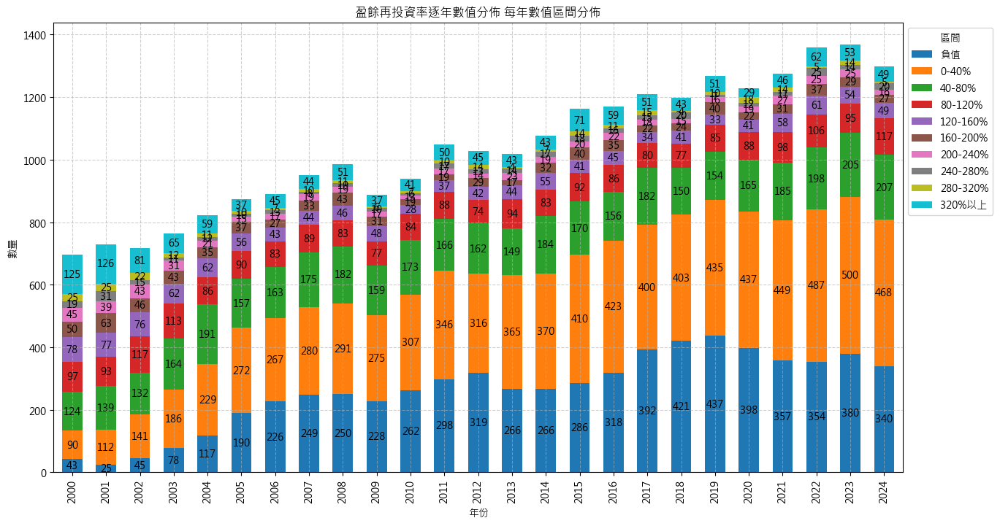

In [12]:
plot_data.numeric_bins(rr, "盈餘再投資率逐年數值分佈", stacked=True, num_label=True,
                bins=[-np.inf, 0, 0.40, 0.80, 1.20, 1.60, 2.00, 2.40, 2.80, 3.20, np.inf], 
                labels=['負值' ,'0-40%', '40-80%', '80-120%', '120-160%', '160-200%', '200-240%', '240-280%', '280-320%', '320%以上'])

---

### **本益比 (P/E)**
- 每季資料
- 每日資料

In [13]:
pe = data.get('quarter_report:PE')[START_DATE:END_DATE]
daily_pe = data.get('price:daily_pe')[START_DATE:END_DATE]

### **其他因子**

- ROE (季資料，取第四季)
- 股利支付率 (只有年資料) ＝〈現金股利總額〈元〉／ 股利分配年度之稅後淨利〉x 100
- 董監持股 (沒有每年的資料，缺值採向前補值)
- 上市上櫃滿兩年

In [14]:
roe = data.get('annual_report:ROE')
payout_ratio = data.get('annual_report_fundamentals:股利支付率')

In [15]:
stock_hold = data.get('annual_report_fundamentals:董監持股%')

In [16]:
# listed_date = pd.read_csv('../2024_code/最近上市日.csv', encoding='cp950')

##### 上市上櫃滿兩年

In [17]:
close = data.get('price:close')
comp_profile = data.get('company_profile')



stock_data = {}

for index, row in comp_profile.iterrows():
    stock_code = row['company_symbol']
    listed_date_ = row['ipo_date']
    end_date = listed_date_ + pd.DateOffset(years=2)
    
    # 創建一個全為 True 的 series
    series = pd.Series(True, index=close.index)
    # 在上市日之前和之後兩年內設置為 False
    series.loc[:end_date] = False
    
    stock_data[stock_code] = series

listed = pd.concat(stock_data, axis=1)

In [18]:
comp_profile

,company_symbol,name,ipo_date,industry
0,1101,台泥,1962-02-09,水泥工業
1,1102,亞泥,1962-06-18,水泥工業
2,1103,嘉泥,1969-11-27,水泥工業
3,1104,環泥,1971-02-02,水泥工業
4,1108,幸福,1990-06-06,水泥工業
...,...,...,...,...
1843,9951,皇田,2003-12-18,電機機械
1844,9955,佳龍,2008-01-21,綠能環保
1845,9958,世紀鋼,2008-03-12,鋼鐵工業
1846,9960,邁達康,2004-12-06,運動休閒


---

## 選股條件
- ROE 五年平均 > 15%
- 盈再率 < 80%
- 稅後淨利 > 五億
- 配息 > 40%
- 董監持股 > 10%
- 上市上櫃滿兩年
- PE < 12買入，>30賣出

In [19]:
# ROE 5年平均 > 15%
roe_rol = roe.rolling(5).mean()
roe_15 = (roe_rol > 15)[START_DATE:END_DATE]

In [20]:
rr_cond = (rr < 0.4)[START_DATE:END_DATE]

In [21]:
# *最近3年的配息率有無一年不及40%*
payout_ratio_cond = (payout_ratio.rolling(3).min() >= 40)[START_DATE:END_DATE]

# # 金融股看配息率，不看盈再率
# rr_cond[finance_stock_list] = payout_ratio_cond[finance_stock_list]

In [22]:
# 淨利 > 5億
profit_cond = (profit > 500000)[START_DATE:END_DATE] # TEJ 的淨利單位是千元

In [23]:
hold_cond = stock_hold[START_DATE:END_DATE] > 10

In [24]:
listed = listed.resample('M').last()[START_DATE:END_DATE]

---

## 原始條件 + 無本益比進出場條件

In [25]:
orig_all_cond = roe_15 & rr_cond & payout_ratio_cond & profit_cond & hold_cond & listed

In [26]:
# # 繪製折線圖
# plt.figure(figsize=(14, 8))

# plt.plot(valid_cond_2.sum(axis=1), label='roe_15', marker='o')
# plt.plot(valid_cond_3.sum(axis=1), label='roe_15 & payout_ratio_cond', marker='o')
# plt.plot(valid_cond_4.sum(axis=1), label='roe_15 & payout_ratio_cond & profit_cond', marker='o')
# plt.plot(valid_cond_5.sum(axis=1), label='roe_15 & payout_ratio_cond & profit_cond & hold_cond', marker='o')
# plt.plot(valid_cond.sum(axis=1), label='不包含盈再率條件')
# plt.plot((valid_cond & (rr['2009':] < 0.8)).sum(axis=1), label='加上盈再率<80%條件')
# plt.plot(orig_all_cond.sum(axis=1), label='加上盈再率<40%條件')

# plt.title('看盈再率條件篩選的入選股數差異')
# plt.xlabel('年份')
# plt.ylabel('入選股數')
# plt.yticks(range(0, 451, 50))  # 設定 y 軸刻度間隔，最大值
# plt.legend(loc='upper left', bbox_to_anchor=(1.05, 1))
# plt.grid(True)
# # 顯示圖表
# plt.show()


---

In [27]:
# 原始條件、無本益比進出場

rep_all_cond = backtest.sim(orig_all_cond, resample='M', data=data)
rep_all_cond.display()

,annualized_rate_of_return,sharpe,max_drawdown,win_ratio
,13.08%,33.37,-29.66%,60.82%


,entry_date,exit_date,entry_sig_date,exit_sig_date,position,period,entry_index,exit_index,return,mae,gmfe,bmfe,mdd,pdays,weight,next_weights
stock_id,,,,,,,,,,,,,,,,
1232,2010-04-01,NaT,2010-03-31,NaT,0.018519,3562.0,2561.0,-1.0,6.900631,-0.034268,7.016694,0.013462,-0.286155,3512.0,0.011364,0.011236
1264,2017-06-01,NaT,2017-05-31,NaT,0.015625,1794.0,4329.0,-1.0,1.158340,-0.082150,1.191629,0.089778,-0.211647,1577.0,0.011364,0.011236
1342,2024-05-02,NaT,2024-04-30,NaT,0.011364,104.0,6019.0,-1.0,-0.128577,-0.201818,0.012400,0.012400,-0.211594,1.0,0.011364,0.011236
1436,2024-05-02,NaT,2024-04-30,NaT,0.011364,104.0,6019.0,-1.0,0.061549,-0.114867,0.402867,0.108105,-0.293478,82.0,0.011364,0.011236
1476,2016-04-01,NaT,2016-03-31,NaT,0.016667,2076.0,4047.0,-1.0,0.722356,-0.446898,0.921689,0.221454,-0.547178,1305.0,0.011364,0.011236
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9910,2013-05-02,NaT,2013-04-30,NaT,0.018519,2795.0,3328.0,-1.0,7.434612,-0.043701,9.697204,0.000000,-0.497123,2781.0,0.011364,0.011236
9917,2009-04-01,NaT,2009-03-31,NaT,0.018182,3813.0,2310.0,-1.0,5.504782,-0.002170,6.006006,0.054232,-0.163898,3811.0,0.011364,0.011236
9921,2021-04-01,NaT,2021-03-31,NaT,0.013333,854.0,5269.0,-1.0,-0.248502,-0.470354,0.085675,0.085675,-0.512150,56.0,0.011364,0.011236


In [28]:
# rep_all_cond.trades.sort_values('stock_id', ascending=True).to_csv('../2024_code/exp_data/rep_all_cond_trades_2.csv', encoding='cp950')

In [29]:
# rep_all_cond.plot_holding_period_return()

## 原始條件 + 有本益比進出場

### 每季本益比進出場

In [30]:
# (每季)本益比條件

pe_cond_entry = pe < 12
pe_cond_exit = pe > 30

In [31]:
orig_all_cond_and_pe = ((orig_all_cond & pe_cond_entry).hold_until((~orig_all_cond) | pe_cond_exit))

In [32]:
rep_all_cond_and_pe = backtest.sim(orig_all_cond_and_pe, resample='M', data=data)
rep_all_cond_and_pe.get_stats()

{'CAGR': 0.1479680032649915,
 'daily_sharpe': 29.91,
 'max_drawdown': -0.30477841785317006,
 'avg_drawdown': -0.04115215795697864,
 'win_ratio': 0.6476190476190476,
 'ytd': 0.17779831524935563}

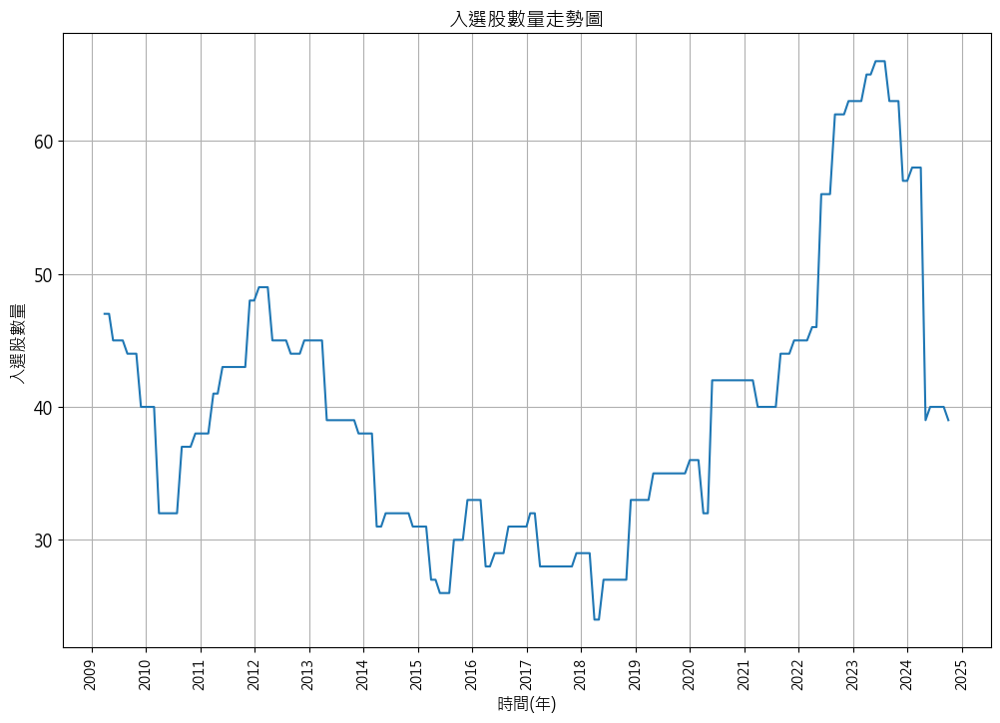

In [33]:
rep_all_cond_and_pe.plot_company_counts()

### 每月本益比進出場

In [34]:
# 每日本益比resample成每月
daily_pe_resample = daily_pe.resample('M').last()

pe_cond_entry_daily = daily_pe_resample < 12
pe_cond_exit_daily = daily_pe_resample > 30

In [35]:
orig_all_cond_and_pe_daily = ((orig_all_cond & pe_cond_entry_daily).hold_until((~orig_all_cond) | pe_cond_exit_daily))

rep_all_cond_and_pe_daily = backtest.sim(orig_all_cond_and_pe_daily, resample='M', data=data)
rep_all_cond_and_pe_daily.display()

,annualized_rate_of_return,sharpe,max_drawdown,win_ratio
,14.72%,30.25,-30.55%,65.28%


,entry_date,exit_date,entry_sig_date,exit_sig_date,position,period,entry_index,exit_index,return,mae,gmfe,bmfe,mdd,pdays,weight,next_weights
stock_id,,,,,,,,,,,,,,,,
1232,2010-05-03,NaT,2010-04-30,NaT,0.033333,3541.0,2582.0,-1.0,6.871704,-0.037802,6.987364,0.000000,-0.286155,3503.0,0.029412,0.028571
1436,2024-05-02,NaT,2024-04-30,NaT,0.027778,104.0,6019.0,-1.0,0.061549,-0.114867,0.402867,0.108105,-0.293478,82.0,0.029412,0.028571
1537,2013-05-02,NaT,2013-04-30,NaT,0.028571,2795.0,3328.0,-1.0,3.692059,-0.017000,3.901485,0.000000,-0.299662,2791.0,0.029412,0.028571
1580,2024-08-01,NaT,2024-07-31,NaT,0.029412,42.0,6081.0,-1.0,0.014352,-0.053872,0.050505,0.000000,-0.067308,25.0,0.029412,0.028571
2020,2024-05-02,NaT,2024-04-30,NaT,0.027778,104.0,6019.0,-1.0,-0.054583,-0.150202,0.046422,0.046422,-0.187901,24.0,0.029412,0.028571
2373,2018-04-02,NaT,2018-03-31,NaT,0.035714,1585.0,4538.0,-1.0,0.194317,-0.034444,0.343983,0.000000,-0.211970,1555.0,0.029412,0.028571
2377,2019-05-02,NaT,2019-04-30,NaT,0.027778,1322.0,4801.0,-1.0,1.741286,-0.117647,2.121393,0.003530,-0.457523,1276.0,0.029412,0.028571
2385,2019-06-03,NaT,2019-05-31,NaT,0.026316,1300.0,4823.0,-1.0,2.153476,-0.043194,3.779579,0.366465,-0.415575,1296.0,0.029412,0.028571
2420,2022-04-01,NaT,2022-03-31,NaT,0.017857,609.0,5514.0,-1.0,1.113961,-0.078794,1.175743,0.011589,-0.214186,444.0,0.029412,0.028571


In [36]:
# all_cond_pos_ret, all_cond_neg_ret = rep_all_cond_and_pe_daily.calc_returns_contrib(5)

---

## 綜合比較入選股數變化

In [37]:
all_cond_reps = {}

all_cond_reps['原始條件_無本益比進出場'] = orig_all_cond
all_cond_reps['原始條件_每季本益比'] = orig_all_cond_and_pe
all_cond_reps['原始條件_每日本益比'] = orig_all_cond_and_pe_daily


rep_collecs = sim_conditions(all_cond_reps, resample='M', data=data)
# rep_collecs.plot_creturns()

Backtesting progress:   0%|          | 0/3 [00:00<?, ?condition/s]

Backtesting progress: 100%|██████████| 3/3 [00:12<00:00,  4.27s/condition]


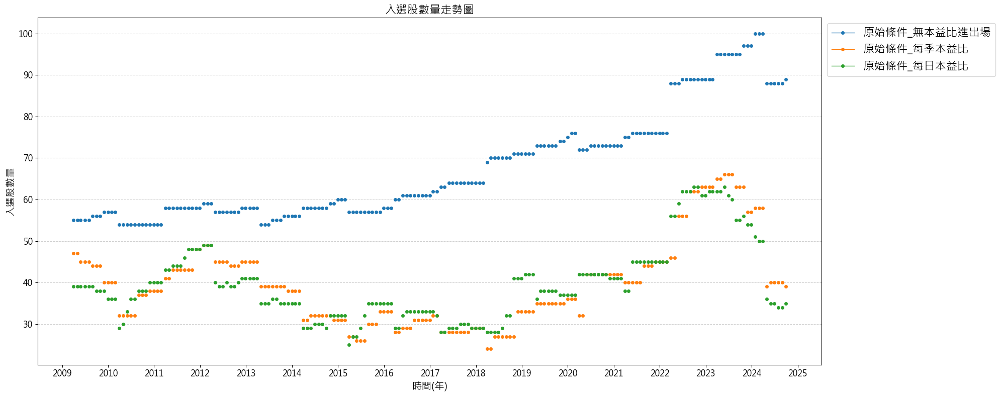

In [38]:
rep_collecs.plot_reps_stock_counts()

In [39]:
# rep = rep_collecs.reports['原始條件_無本益比進出場']

# df_stats_cagr = rep.get_stats()['CAGR']
# df_stats_mdd = rep.get_stats()['max_drawdown']

In [40]:
# df = rep_collecs.reports['原始條件_無本益比進出場'].trades.copy()
# df = df[['stock_id', 'entry_date', 'exit_date']]
# # 獲取 price:close 資料中的最後一個日期
# last_date = rep.cashflow.index[-1]
# # 將 exit_date 為 NaT 的行補上最後一個日期
# df['exit_date'].fillna(last_date, inplace=True)

# # 計算持有期
# df['holding_periods'] = (df['exit_date'] - df['entry_date']).dt.days

# df

In [41]:
# # 計算 df['holding_periods'] 的平均、中位數、最大值、最小值、25%、75%分位數
# holding_stat_df = {
#     'CAGR': df_stats_cagr,
#     'MDD': df_stats_mdd,
#     '平均': df['holding_periods'].mean(),
#     '25%': df['holding_periods'].quantile(0.25),
#     '中位數': df['holding_periods'].median(),
#     '75%': df['holding_periods'].quantile(0.75),
#     '最大值': df['holding_periods'].max(),
#     '最小值': df['holding_periods'].min(),
# }

# holding_stat_df

In [42]:
rep_collecs.holding_period_analysis()

,CAGR (%),MDD (%),持有期間平均,25%,中位數,75%,最大值,最小值
Strategy,,,,,,,,
原始條件_每季本益比,14.80,-30.48,898.928000,365.0,543.0,1193.00,5143.0,61.0
原始條件_每日本益比,14.72,-30.55,898.224000,365.0,594.0,1120.25,5264.0,60.0
原始條件_無本益比進出場,13.08,-29.66,1071.325843,366.0,731.0,1457.75,5661.0,58.0


---

## ROE 參數最佳化 + 有無本益比進出場

In [43]:
pe_cond_entry = daily_pe_resample < 12
pe_cond_exit = daily_pe_resample > 30



roe_value_cond = {}
no_roe_conds = rr_cond & payout_ratio_cond & profit_cond & hold_cond & listed

for i in range(10, 26, 5): # 大於 10~25%
    for n in range(3, 6): # 3, 4, 5年平均
        
        roe_rolling = roe.rolling(n).mean()
        roe_cond_opt = (roe_rolling > i)[START_DATE:END_DATE]

        # roe_value_cond[f'roe_{n}y_{i} 無本益比進出場'] = (roe_cond_opt & no_roe_conds)['2009':]
        roe_value_cond[f'roe_{n}y_{i} 有本益比進出場'] = ((roe_cond_opt &  no_roe_conds & pe_cond_entry).hold_until((~(roe_cond_opt &  no_roe_conds)) | pe_cond_exit))[START_DATE:END_DATE]
        
roe_collection = sim_conditions(roe_value_cond, resample='M', data=data)

Backtesting progress: 100%|██████████| 12/12 [00:39<00:00,  3.33s/condition]


In [44]:
roe_collection.selected_stock_count_analysis()

,CAGR (%),MDD (%),入選股數平均,中位數,25%,75%,Min,Max
Strategy,,,,,,,,
roe_4y_15 有本益比進出場,15.33,-30.85,39.390374,37.0,32.0,42.0,23.0,66.0
roe_4y_10 有本益比進出場,15.10,-29.47,64.368984,60.0,54.5,73.0,34.0,107.0
roe_5y_10 有本益比進出場,15.06,-29.83,63.834225,59.0,53.0,74.0,34.0,104.0
roe_3y_10 有本益比進出場,14.95,-29.62,64.117647,60.0,52.0,73.0,33.0,113.0
roe_5y_15 有本益比進出場,14.72,-30.55,39.641711,38.0,33.0,43.0,25.0,63.0
roe_3y_15 有本益比進出場,14.23,-30.59,39.636364,38.0,33.0,42.0,25.0,69.0
roe_3y_20 有本益比進出場,12.45,-31.64,20.962567,20.0,15.0,25.0,9.0,39.0
roe_4y_20 有本益比進出場,12.32,-32.57,20.449198,19.0,15.0,26.0,11.0,33.0
roe_5y_20 有本益比進出場,10.95,-32.57,20.208556,19.0,16.0,24.5,9.0,33.0


In [45]:
# roe_collection.compare_strat_perform('無本益比進出場', '有本益比進出場')

In [46]:
roe_value_cond = {}

for i in range(10, 26, 5): # 大於 10~25%
    for n in range(3, 6): # 3, 4, 5年平均
        
        roe_rolling = roe.rolling(n).mean()
        roe_cond_opt = (roe_rolling > i)[START_DATE:END_DATE]

        roe_value_cond[f'roe_{n}y_{i} 有本益比進出場'] = ((roe_cond_opt &  no_roe_conds & pe_cond_entry).hold_until((~(roe_cond_opt &  no_roe_conds)) | pe_cond_exit))[START_DATE:END_DATE]
        
roe_collection = sim_conditions(roe_value_cond, resample='M', data=data)

Backtesting progress: 100%|██████████| 12/12 [00:44<00:00,  3.67s/condition]


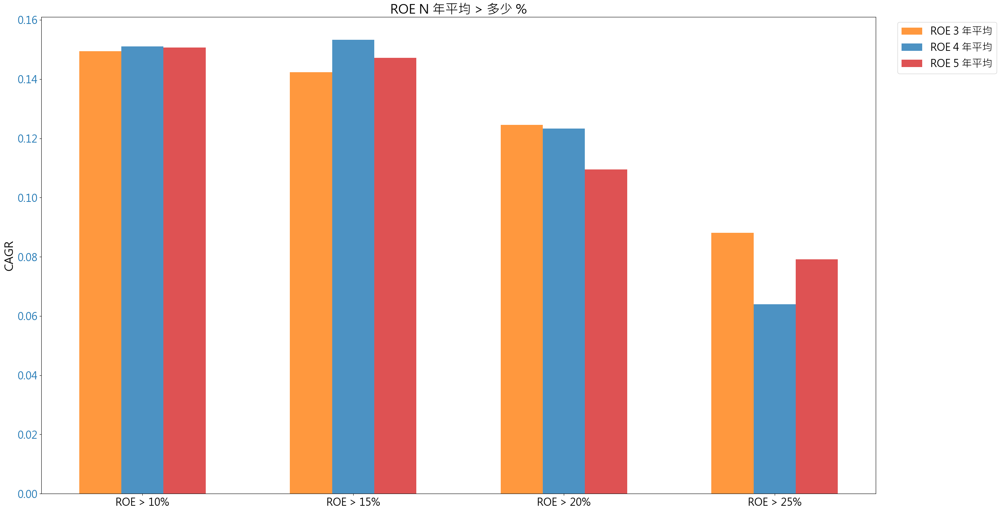

In [47]:
roe_collection.plot_roe_cagr() 

In [48]:
roe_collection.selected_stock_count_analysis()

,CAGR (%),MDD (%),入選股數平均,中位數,25%,75%,Min,Max
Strategy,,,,,,,,
roe_4y_15 有本益比進出場,15.33,-30.85,39.390374,37.0,32.0,42.0,23.0,66.0
roe_4y_10 有本益比進出場,15.10,-29.47,64.368984,60.0,54.5,73.0,34.0,107.0
roe_5y_10 有本益比進出場,15.06,-29.83,63.834225,59.0,53.0,74.0,34.0,104.0
roe_3y_10 有本益比進出場,14.95,-29.62,64.117647,60.0,52.0,73.0,33.0,113.0
roe_5y_15 有本益比進出場,14.72,-30.55,39.641711,38.0,33.0,43.0,25.0,63.0
roe_3y_15 有本益比進出場,14.23,-30.59,39.636364,38.0,33.0,42.0,25.0,69.0
roe_3y_20 有本益比進出場,12.45,-31.64,20.962567,20.0,15.0,25.0,9.0,39.0
roe_4y_20 有本益比進出場,12.32,-32.57,20.449198,19.0,15.0,26.0,11.0,33.0
roe_5y_20 有本益比進出場,10.95,-32.57,20.208556,19.0,16.0,24.5,9.0,33.0


---

## 每季本益比資料 - 比較不同resample週期

### 每月

#### 月初、月中、月底 (每季資料)

In [49]:
rep_all_cond_and_pe_MS = backtest.sim(orig_all_cond_and_pe, resample='MS', data=data)
rep_all_cond_and_pe_MS.get_stats()

{'CAGR': 0.14604892127821123,
 'daily_sharpe': 29.99,
 'max_drawdown': -0.304778417692793,
 'avg_drawdown': -0.04141306423367394,
 'win_ratio': 0.6571428571428571,
 'ytd': 0.17603105335448843}

In [50]:
rep_all_cond_and_pe_M15 = backtest.sim(orig_all_cond_and_pe, resample='M', resample_offset='15D', data=data)
rep_all_cond_and_pe_M15.get_stats()

{'CAGR': 0.13940862201631,
 'daily_sharpe': 29.87,
 'max_drawdown': -0.3064989753237275,
 'avg_drawdown': -0.041814482452251445,
 'win_ratio': 0.6587677725118484,
 'ytd': 0.1822403892691835}

In [51]:
rep_all_cond_and_pe_M = backtest.sim(orig_all_cond_and_pe, resample='M', data=data)
rep_all_cond_and_pe_M.get_stats()

{'CAGR': 0.1479680032649915,
 'daily_sharpe': 29.91,
 'max_drawdown': -0.30477841785317006,
 'avg_drawdown': -0.04115215795697864,
 'win_ratio': 0.6476190476190476,
 'ytd': 0.17779831524935563}

### 每季 (3, 6, 9, 12月)

In [52]:
rep_all_cond_and_pe_Q_orig = backtest.sim(orig_all_cond_and_pe, resample='Q',data=data)
rep_all_cond_and_pe_Q_orig.display()

,annualized_rate_of_return,sharpe,max_drawdown,win_ratio
,14.76%,29.67,-30.34%,67.14%


,entry_date,exit_date,entry_sig_date,exit_sig_date,position,period,entry_index,exit_index,return,mae,gmfe,bmfe,mdd,pdays,weight,next_weights
stock_id,,,,,,,,,,,,,,,,
1232,2010-10-01,NaT,2010-09-30,NaT,0.027027,3434.0,2689.0,-1.0,6.345132,0.000000,6.453452,0.000000,-0.286155,3433.0,0.025,0.025641
1436,2024-07-01,NaT,2024-06-28,NaT,0.025000,63.0,6060.0,-1.0,-0.059891,-0.121610,0.243260,0.243260,-0.293478,49.0,0.025,0.025641
1537,2013-07-01,NaT,2013-06-28,NaT,0.025641,2754.0,3369.0,-1.0,2.967407,-0.040525,3.145432,0.031370,-0.299662,2743.0,0.025,0.025641
2020,2024-07-01,NaT,2024-06-28,NaT,0.025000,63.0,6060.0,-1.0,-0.005630,-0.106470,0.013890,0.013890,-0.118711,9.0,0.025,0.025641
2108,2020-04-01,NaT,2020-03-31,NaT,0.031250,1098.0,5025.0,-1.0,0.820634,0.000000,5.735743,0.000000,-0.778691,1097.0,0.025,0.025641
2373,2018-07-02,NaT,2018-06-29,NaT,0.037037,1525.0,4598.0,-1.0,0.190328,0.000000,0.339516,0.000000,-0.211970,1524.0,0.025,0.025641
2377,2019-07-01,NaT,2019-06-28,NaT,0.028571,1281.0,4842.0,-1.0,1.603159,-0.147532,1.964449,0.141359,-0.457523,1224.0,0.025,0.025641
2382,2023-04-06,NaT,2023-03-31,NaT,0.015385,365.0,5758.0,-1.0,2.245105,-0.030523,3.199151,0.011123,-0.306423,356.0,0.025,0.025641
2385,2019-07-01,NaT,2019-06-28,NaT,0.028571,1281.0,4842.0,-1.0,1.907385,-0.117723,3.407281,0.260026,-0.415575,1265.0,0.025,0.025641


### 每年

#### 每年三月底 + 15天、30天、45天

In [53]:
rep_all_cond_and_pe_A_MAR = backtest.sim(orig_all_cond_and_pe, resample='A-MAR', resample_offset="15D",data=data)
rep_all_cond_and_pe_A_MAR.display()

,annualized_rate_of_return,sharpe,max_drawdown,win_ratio
,14.79%,27.84,-29.8%,59.46%


,entry_date,exit_date,entry_sig_date,exit_sig_date,position,period,entry_index,exit_index,return,mae,gmfe,bmfe,mdd,pdays,weight,next_weights
stock_id,,,,,,,,,,,,,,,,
1232,2011-04-18,NaT,2011-04-15,NaT,0.024390,3302.0,2821.0,-1.0,4.649271,-0.070469,4.733951,0.080428,-0.286155,3151.0,0.025641,0.025641
1537,2013-04-16,NaT,2013-04-15,NaT,0.025641,2806.0,3317.0,-1.0,3.849650,0.000000,4.065905,0.000000,-0.299662,2805.0,0.025641,0.025641
2020,2024-04-16,NaT,2024-04-15,NaT,0.025641,115.0,6008.0,-1.0,0.006381,-0.095740,0.113485,0.113485,-0.187901,69.0,0.025641,0.025641
2108,2020-04-16,NaT,2020-04-15,NaT,0.031250,1089.0,5034.0,-1.0,0.706284,-0.019129,5.314040,0.015655,-0.778691,1085.0,0.025641,0.025641
2373,2019-04-16,NaT,2019-04-15,NaT,0.028571,1333.0,4790.0,-1.0,0.084289,-0.071402,0.220770,0.118459,-0.169752,1313.0,0.025641,0.025641
2377,2019-04-16,NaT,2019-04-15,NaT,0.028571,1333.0,4790.0,-1.0,1.687419,-0.134948,2.060188,0.009227,-0.457523,1270.0,0.025641,0.025641
2382,2023-04-17,NaT,2023-04-14,NaT,0.015385,358.0,5765.0,-1.0,2.347459,0.000000,3.331358,0.000000,-0.306423,357.0,0.025641,0.025641
2385,2019-04-16,NaT,2019-04-15,NaT,0.028571,1333.0,4790.0,-1.0,2.222433,-0.040928,3.883900,0.043655,-0.415575,1316.0,0.025641,0.025641
2420,2023-04-17,NaT,2023-04-14,NaT,0.015385,358.0,5765.0,-1.0,0.890169,-0.033370,0.946046,0.000000,-0.214186,339.0,0.025641,0.025641


In [54]:
rep_all_cond_and_pe_A_MAR_30D = backtest.sim(orig_all_cond_and_pe, resample='A-MAR', resample_offset="30D",data=data)
rep_all_cond_and_pe_A_MAR_30D.display()

,annualized_rate_of_return,sharpe,max_drawdown,win_ratio
,14.01%,28.87,-29.95%,60.0%


,entry_date,exit_date,entry_sig_date,exit_sig_date,position,period,entry_index,exit_index,return,mae,gmfe,bmfe,mdd,pdays,weight,next_weights
stock_id,,,,,,,,,,,,,,,,
1232,2011-05-03,NaT,2011-04-29,NaT,0.024390,3292.0,2831.0,-1.0,4.617513,-0.075689,4.701750,0.074360,-0.286155,3125.0,0.025641,0.025641
1537,2013-05-02,NaT,2013-04-30,NaT,0.025641,2795.0,3328.0,-1.0,3.692059,-0.017000,3.901485,0.000000,-0.299662,2791.0,0.025641,0.025641
2020,2024-05-02,NaT,2024-04-30,NaT,0.025641,104.0,6019.0,-1.0,-0.054583,-0.150202,0.046422,0.046422,-0.187901,24.0,0.025641,0.025641
2108,2020-05-04,NaT,2020-04-30,NaT,0.031250,1078.0,5045.0,-1.0,0.651516,0.000000,5.112066,0.000000,-0.778691,1077.0,0.025641,0.025641
2373,2019-05-02,NaT,2019-04-30,NaT,0.028571,1322.0,4801.0,-1.0,0.031577,-0.116303,0.161741,0.064378,-0.169752,1111.0,0.025641,0.025641
2377,2019-05-02,NaT,2019-04-30,NaT,0.028571,1322.0,4801.0,-1.0,1.741286,-0.117647,2.121393,0.003530,-0.457523,1276.0,0.025641,0.025641
2382,2023-05-02,NaT,2023-04-28,NaT,0.015385,348.0,5775.0,-1.0,2.036831,-0.006696,2.930129,0.000000,-0.306423,344.0,0.025641,0.025641
2385,2019-05-02,NaT,2019-04-30,NaT,0.028571,1322.0,4801.0,-1.0,2.140868,-0.065160,3.760504,0.017286,-0.415575,1297.0,0.025641,0.025641
2420,2023-05-02,NaT,2023-04-28,NaT,0.015385,348.0,5775.0,-1.0,0.898644,-0.010055,0.954744,0.012291,-0.214186,341.0,0.025641,0.025641


In [55]:
rep_all_cond_and_pe_A_MAR_45D = backtest.sim(orig_all_cond_and_pe, resample='A-MAR', resample_offset="45D",data=data)
rep_all_cond_and_pe_A_MAR_45D.display()

,annualized_rate_of_return,sharpe,max_drawdown,win_ratio
,13.39%,30.05,-30.9%,63.87%


,entry_date,exit_date,entry_sig_date,exit_sig_date,position,period,entry_index,exit_index,return,mae,gmfe,bmfe,mdd,pdays,weight,next_weights
stock_id,,,,,,,,,,,,,,,,
1232,2011-05-16,NaT,2011-05-13,NaT,0.024390,3283.0,2840.0,-1.0,4.617513,-0.075689,4.701750,0.074360,-0.286155,3119.0,0.025,0.025641
1436,2024-05-16,NaT,2024-05-15,NaT,0.025000,94.0,6029.0,-1.0,0.143066,-0.047270,0.510004,0.000000,-0.293478,84.0,0.025,0.025641
1537,2013-05-16,NaT,2013-05-15,NaT,0.025641,2785.0,3338.0,-1.0,3.269177,-0.014065,3.460278,0.015470,-0.299662,2781.0,0.025,0.025641
2020,2024-05-16,NaT,2024-05-15,NaT,0.025000,94.0,6029.0,-1.0,-0.079003,-0.172017,0.004891,0.004891,-0.176046,1.0,0.025,0.025641
2108,2020-05-18,NaT,2020-05-15,NaT,0.023810,1068.0,5055.0,-1.0,0.331752,-0.048911,3.932835,0.000000,-0.778691,1046.0,0.025,0.025641
2373,2018-05-16,NaT,2018-05-15,NaT,0.037037,1557.0,4566.0,-1.0,0.191655,-0.004435,0.341001,0.014412,-0.211970,1549.0,0.025,0.025641
2377,2019-05-16,NaT,2019-05-15,NaT,0.028571,1312.0,4811.0,-1.0,2.026703,-0.010389,2.445695,0.025975,-0.457523,1305.0,0.025,0.025641
2382,2023-05-16,NaT,2023-05-15,NaT,0.015152,338.0,5785.0,-1.0,1.693399,-0.004951,2.486529,0.000000,-0.306423,336.0,0.025,0.025641
2385,2019-05-16,NaT,2019-05-15,NaT,0.028571,1312.0,4811.0,-1.0,2.327016,-0.009858,4.042118,0.000000,-0.415575,1309.0,0.025,0.025641


---

## **每月**本益比資料 - 比較不同resample週期

In [56]:
daily_pe_entry = daily_pe < 12
daily_pe_exit = daily_pe > 30

### 每月

#### 月初、月中、月底

In [57]:
daily_pe_entry_MS = daily_pe_entry.resample('MS').first()
daily_pe_exit_MS = daily_pe_exit.resample('MS').first()


PE_daily_MS_cond = ((orig_all_cond & daily_pe_entry_MS).hold_until((~orig_all_cond) | daily_pe_exit_MS))
rep_PE_daily_MS_cond = backtest.sim(PE_daily_MS_cond, resample='MS', data=data)
rep_PE_daily_MS_cond.get_stats()

{'CAGR': 0.14791918665776893,
 'daily_sharpe': 30.22,
 'max_drawdown': -0.3084046899980153,
 'avg_drawdown': -0.041235262081864586,
 'win_ratio': 0.641860465116279,
 'ytd': 0.19572207859321722}

In [58]:
rep_PE_daily_M15_cond = backtest.sim(orig_all_cond_and_pe_daily, resample='M', resample_offset='15D', data=data)
rep_PE_daily_M15_cond.display()

,annualized_rate_of_return,sharpe,max_drawdown,win_ratio
,14.13%,30.06,-30.73%,63.89%


,entry_date,exit_date,entry_sig_date,exit_sig_date,position,period,entry_index,exit_index,return,mae,gmfe,bmfe,mdd,pdays,weight,next_weights
stock_id,,,,,,,,,,,,,,,,
1232,2010-05-17,NaT,2010-05-14,NaT,0.033333,3531,2592,-1,6.949302,-0.028324,7.066044,0.002461,-0.286155,3511.0,0.028571,0.028571
1436,2024-04-16,NaT,2024-04-15,NaT,0.027778,115,6008,-1,0.436850,0.000000,0.896119,0.000000,-0.293478,114.0,0.028571,0.028571
1537,2013-04-16,NaT,2013-04-15,NaT,0.028571,2806,3317,-1,3.849650,0.000000,4.065905,0.000000,-0.299662,2805.0,0.028571,0.028571
1580,2024-08-16,NaT,2024-08-15,NaT,0.029412,31,6092,-1,-0.025267,-0.058252,0.009709,0.009709,-0.067308,2.0,0.028571,0.028571
2020,2024-04-16,NaT,2024-04-15,NaT,0.027778,115,6008,-1,0.006381,-0.095740,0.113485,0.113485,-0.187901,69.0,0.028571,0.028571
2373,2018-04-16,NaT,2018-04-13,NaT,0.035714,1578,4545,-1,0.199673,-0.030135,0.349980,0.000000,-0.211970,1562.0,0.028571,0.028571
2377,2019-05-16,NaT,2019-05-15,NaT,0.027778,1312,4811,-1,2.026703,-0.010389,2.445695,0.025975,-0.457523,1305.0,0.028571,0.028571
2385,2019-06-17,NaT,2019-06-14,NaT,0.026316,1291,4832,-1,2.095506,-0.060751,3.691878,0.341391,-0.415575,1286.0,0.028571,0.028571
2420,2022-04-18,NaT,2022-04-15,NaT,0.017857,600,5523,-1,1.136301,-0.069086,1.198672,0.019907,-0.214186,465.0,0.028571,0.028571


### 每季

In [59]:
daily_pe_entry_Q = daily_pe_entry.resample('Q').last()
daily_pe_exit_Q = daily_pe_exit.resample('Q').last()

PE_daily_Q_cond = ((orig_all_cond & daily_pe_entry_Q).hold_until((~orig_all_cond) | daily_pe_exit_Q))
rep_PE_daily_Q_cond = backtest.sim(PE_daily_Q_cond, resample='Q', data=data)
rep_PE_daily_Q_cond.get_stats()

{'CAGR': 0.14424461655591392,
 'daily_sharpe': 30.65,
 'max_drawdown': -0.3054893569241388,
 'avg_drawdown': -0.042694728738729204,
 'win_ratio': 0.6666666666666666,
 'ytd': 0.1937264075765328}

### 每年

In [60]:
daily_pe_entry_A = daily_pe_entry.resample('A-MAR').last()
daily_pe_exit_A = daily_pe_exit.resample('A-MAR').last()

PE_daily_AMAR_cond = ((orig_all_cond & daily_pe_entry_A).hold_until((~orig_all_cond) | daily_pe_exit_A))
rep_PE_daily_AMAR15 = backtest.sim(PE_daily_AMAR_cond, resample='A-MAR', resample_offset='15D',data=data)
rep_PE_daily_AMAR15.display()

,annualized_rate_of_return,sharpe,max_drawdown,win_ratio
,14.73%,28.93,-30.67%,63.25%


,entry_date,exit_date,entry_sig_date,exit_sig_date,position,period,entry_index,exit_index,return,mae,gmfe,bmfe,mdd,pdays,weight,next_weights
stock_id,,,,,,,,,,,,,,,,
1527,2023-04-17,2024-04-16,2023-04-14,2024-04-15,0.017544,243,5765,6008,-0.000892,-0.065593,0.062418,0.000000,-0.065593,51.0,0.000000,0.000000
2059,2023-04-17,2024-04-16,2023-04-14,2024-04-15,0.017544,243,5765,6008,1.904447,-0.032688,2.640946,0.024211,-0.310652,228.0,0.000000,0.000000
2227,2020-04-16,2024-04-16,2020-04-15,2024-04-15,0.027027,974,5034,6008,-0.327614,-0.321764,0.293716,0.293716,-0.475746,717.0,0.000000,0.000000
2376,2022-04-18,2024-04-16,2022-04-15,2024-04-15,0.018519,485,5523,6008,2.188130,-0.265766,3.029492,0.045046,-0.385594,359.0,0.000000,0.000000
2404,2023-04-17,2024-04-16,2023-04-14,2024-04-15,0.017544,243,5765,6008,1.052459,-0.011765,1.118920,0.000000,-0.183552,238.0,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6691,2024-04-16,NaT,2024-04-15,NaT,0.027778,115,6008,-1,-0.039559,-0.096613,0.141780,0.015053,-0.207192,58.0,0.027778,0.027778
8109,2023-04-17,NaT,2023-04-14,NaT,0.017544,358,5765,-1,0.028871,-0.097689,0.228529,0.000000,-0.197598,293.0,0.027778,0.027778
8464,2020-04-16,NaT,2020-04-15,NaT,0.027027,1089,5034,-1,1.944327,0.000000,1.967531,0.000000,-0.499921,1088.0,0.027778,0.027778


In [61]:
rep_PE_daily_AMAR30 = backtest.sim(PE_daily_AMAR_cond, resample='A-MAR', resample_offset='30D',data=data)
rep_PE_daily_AMAR30.get_stats()

{'CAGR': 0.13544249223444926,
 'daily_sharpe': 31.13,
 'max_drawdown': -0.3078682373867817,
 'avg_drawdown': -0.04641219594871617,
 'win_ratio': 0.6204819277108434,
 'ytd': 0.18608419585772085}

In [62]:
rep_PE_daily_AMAR45 = backtest.sim(PE_daily_AMAR_cond, resample='A-MAR', resample_offset='45D',data=data)
rep_PE_daily_AMAR45.get_stats()

{'CAGR': 0.13105743754926258,
 'daily_sharpe': 31.59,
 'max_drawdown': -0.30934578041191296,
 'avg_drawdown': -0.04675848596214217,
 'win_ratio': 0.6144578313253012,
 'ytd': 0.2012695952116459}

### 每週、兩週

In [69]:
# daily_pe_entry_W = daily_pe_entry.resample('W').last()
# daily_pe_exit_W = daily_pe_exit.resample('W').last()


# PE_daily_W_cond = ((orig_all_cond & daily_pe_entry_W).hold_until((~orig_all_cond) | daily_pe_exit_W))
# rep_PE_daily_W = backtest.sim(PE_daily_W_cond, resample='W', data=data)
# rep_PE_daily_W.get_stats()

In [70]:
daily_pe_entry_2W = daily_pe_entry.resample('2W').last()
daily_pe_exit_2W = daily_pe_exit.resample('2W').last()

PE_daily_2W_cond = ((orig_all_cond & daily_pe_entry_2W).hold_until((~orig_all_cond) | daily_pe_exit_2W))
rep_PE_daily_2W = backtest.sim(PE_daily_2W_cond, resample='2W', data=data)
rep_PE_daily_2W.get_stats()

{'CAGR': 0.14445997152179268,
 'daily_sharpe': 29.8,
 'max_drawdown': -0.3090774458329675,
 'avg_drawdown': -0.041126535912012895,
 'win_ratio': 0.6517857142857143,
 'ytd': 0.18343729000204845}

### 每日

In [71]:
PE_daily_D_cond = ((orig_all_cond & daily_pe_entry).hold_until((~orig_all_cond) | daily_pe_exit))
rep_PE_daily_D = backtest.sim(PE_daily_D_cond, resample='D', data=data)
rep_PE_daily_D.display()

ValueError: cannot reindex on an axis with duplicate labels

---

---

## 比較有無某項條件績效差異

### 分成有無進出場條件兩組

In [ ]:
compare_conds_strat_PE={}

In [ ]:
## 比較有無某項條件績效差異

## 單一條件 

# rr_cond
# roe_15

## 比較有無某項條件績效差異 (都有本益比進出場)
sig_1 = (rr_cond & payout_ratio_cond)[START_DATE:END_DATE]
sig_2 = (rr_cond & payout_ratio_cond & hold_cond & listed)[START_DATE:END_DATE]
sig_3 = (rr_cond & payout_ratio_cond & hold_cond)[START_DATE:END_DATE]
sig_4 = (rr_cond & payout_ratio_cond & profit_cond & listed)[START_DATE:END_DATE]
sig_5 = (rr_cond & payout_ratio_cond & profit_cond)[START_DATE:END_DATE]
sig_6 = (roe_15 & rr_cond & profit_cond & hold_cond & listed)[START_DATE:END_DATE]
sig_7 = (roe_15 & rr_cond & hold_cond & listed)[START_DATE:END_DATE]
sig_8 = (rr_cond & profit_cond)[START_DATE:END_DATE]
sig_9 = (roe_15 & rr_cond & profit_cond)[START_DATE:END_DATE]
sig_10 = (roe_15 & rr_cond & payout_ratio_cond)[START_DATE:END_DATE]
sig_11 = (rr_cond & roe_15)[START_DATE:END_DATE]
sig_12 = (roe_15 & payout_ratio_cond & profit_cond & hold_cond & listed)[START_DATE:END_DATE]

In [ ]:
# 策略dict (有本益比進出場)
compare_conds_strat_PE['盈再率+配息率'] = (sig_1 & pe_cond_entry_daily).hold_until(~sig_1 | pe_cond_exit_daily)
compare_conds_strat_PE['盈再率+配息率+董監持股+上市櫃兩年'] = (sig_2 & pe_cond_entry_daily).hold_until(~sig_2 | pe_cond_exit_daily)
compare_conds_strat_PE['盈再率+配息率+董監持股'] = (sig_3 & pe_cond_entry_daily).hold_until(~sig_3 | pe_cond_exit_daily)
compare_conds_strat_PE['盈再率+配息率+淨利+上市櫃兩年'] = (sig_4 & pe_cond_entry_daily).hold_until(~sig_4 | pe_cond_exit_daily)
compare_conds_strat_PE['盈再率+配息率+淨利'] = (sig_5 & pe_cond_entry_daily).hold_until(~sig_5 | pe_cond_exit_daily)
compare_conds_strat_PE['ROE+盈再率+淨利+董監持股+上市櫃兩年'] = (sig_6 & pe_cond_entry_daily).hold_until(~sig_6 | pe_cond_exit_daily)
compare_conds_strat_PE['ROE+盈再率+董監持股+上市櫃兩年'] = (sig_7 & pe_cond_entry_daily).hold_until(~sig_7 | pe_cond_exit_daily)
compare_conds_strat_PE['盈再率+淨利'] = (sig_8 & pe_cond_entry_daily).hold_until(~sig_8 | pe_cond_exit_daily)
compare_conds_strat_PE['ROE+盈再率+淨利'] = (sig_9 & pe_cond_entry_daily).hold_until(~sig_9 | pe_cond_exit_daily)
compare_conds_strat_PE['ROE+盈再率+配息率'] = (sig_10 & pe_cond_entry_daily).hold_until(~sig_10 | pe_cond_exit_daily)
compare_conds_strat_PE['ROE+盈再率'] = (sig_11 & pe_cond_entry_daily).hold_until(~sig_11 | pe_cond_exit_daily)
compare_conds_strat_PE['去掉盈再率'] = (sig_12 & pe_cond_entry_daily).hold_until(~sig_12 | pe_cond_exit_daily)
compare_conds_strat_PE['原始條件_有本益比進出場'] = orig_all_cond_and_pe_daily
# compare_conds_strat_PE['原始條件_無本益比進出場'] = orig_all_cond

compare_PE_strat_collecs = sim_conditions(compare_conds_strat_PE, resample='M', data=data)
compare_PE_strat_collecs.plot_stats('heatmap')

Backtesting progress: 100%|██████████| 13/13 [00:28<00:00,  2.20s/condition]


,CAGR,daily_sharpe,max_drawdown,avg_drawdown,win_ratio,ytd
盈再率+配息率+董監持股+上市櫃兩年,0.140877,24.410000,-0.510688,-0.055760,0.664779,0.194120
盈再率+配息率+董監持股,0.139053,24.650000,-0.521549,-0.057489,0.651899,0.184498
盈再率+配息率,0.138453,24.410000,-0.527999,-0.058909,0.638679,0.194797
盈再率+配息率+淨利+上市櫃兩年,0.119988,26.690000,-0.550542,-0.060678,0.587549,0.218410
盈再率+配息率+淨利,0.117425,27.250000,-0.553672,-0.061190,0.571429,0.211908
盈再率+淨利,0.110557,29.500000,-0.576969,-0.069020,0.537170,0.224198
ROE+盈再率+董監持股+上市櫃兩年,0.109433,30.410000,-0.563219,-0.065786,0.596803,0.200628
ROE+盈再率+配息率,0.109169,29.440000,-0.551076,-0.065088,0.586538,0.165858
原始條件_有本益比進出場,0.107586,28.960000,-0.560956,-0.065152,0.569038,0.189824
去掉盈再率,0.107028,29.720000,-0.549423,-0.065316,0.534722,0.198996


In [ ]:
compare_PE_strat_collecs.selected_stock_count_analysis()

,CAGR,MDD,入選股數平均,中位數,25%,75%,Min,Max
Strategy,,,,,,,,
盈再率+配息率+董監持股+上市櫃兩年,0.140877,-0.510688,201.266129,199.5,161.50,240.25,87.0,290.0
盈再率+配息率+董監持股,0.139053,-0.521549,212.758065,210.0,172.50,248.50,98.0,306.0
盈再率+配息率,0.138453,-0.527999,260.169355,254.0,200.25,315.75,110.0,389.0
盈再率+配息率+淨利+上市櫃兩年,0.119988,-0.550542,110.209677,109.5,84.75,137.00,46.0,184.0
盈再率+配息率+淨利,0.117425,-0.553672,113.677419,111.5,88.75,141.25,48.0,190.0
盈再率+淨利,0.110557,-0.576969,161.467742,165.0,131.75,184.00,75.0,251.0
ROE+盈再率+董監持股+上市櫃兩年,0.109433,-0.563219,106.080645,105.5,91.00,119.25,75.0,139.0
ROE+盈再率+配息率,0.109169,-0.551076,113.669355,113.5,98.00,125.25,74.0,169.0
原始條件_有本益比進出場,0.107586,-0.560956,40.766129,41.0,34.00,45.00,26.0,63.0


In [ ]:
# compare_PE_strat_collecs.holding_period_analysis()

In [ ]:
compare_conds_strat = {}

# 策略dict (無本益比進出場)
compare_conds_strat['盈再率+配息率'] = sig_1
compare_conds_strat['盈再率+配息率+董監持股+上市櫃兩年'] = sig_2
compare_conds_strat['盈再率+配息率+董監持股'] = sig_3
compare_conds_strat['盈再率+配息率+淨利+上市櫃兩年'] = sig_4
compare_conds_strat['盈再率+配息率+淨利'] = sig_5
compare_conds_strat['ROE+盈再率+淨利+董監持股+上市櫃兩年'] = sig_6
compare_conds_strat['ROE+盈再率+董監持股+上市櫃兩年'] = sig_7
compare_conds_strat['盈再率+淨利'] = sig_8
compare_conds_strat['ROE+盈再率+淨利'] = sig_9
compare_conds_strat['ROE+盈再率+配息率'] = sig_10
compare_conds_strat['ROE+盈再率'] = sig_11
compare_conds_strat['原始條件_無本益比進出場'] = orig_all_cond
compare_conds_strat['只看ROE五年平均>15%'] = roe_15
compare_conds_strat['只看盈再率<0.8'] = rr_cond

compare_strat_collecs = sim_conditions(compare_conds_strat, resample='M', data=data)
compare_strat_collecs.plot_stats('heatmap')

Backtesting progress: 100%|██████████| 14/14 [00:54<00:00,  3.92s/condition]


,CAGR,daily_sharpe,max_drawdown,avg_drawdown,win_ratio,ytd
盈再率+配息率+董監持股+上市櫃兩年,0.125968,27.070000,-0.500706,-0.057755,0.616534,0.144805
盈再率+配息率,0.122198,27.460000,-0.504047,-0.059551,0.565801,0.149459
盈再率+配息率+董監持股,0.120899,28.220000,-0.494453,-0.057707,0.583258,0.142418
只看盈再率<0.8,0.115721,28.800000,-0.510227,-0.063240,0.492896,0.163003
盈再率+配息率+淨利+上市櫃兩年,0.111102,28.840000,-0.532133,-0.060096,0.530508,0.137317
盈再率+配息率+淨利,0.107592,29.770000,-0.537685,-0.061673,0.508972,0.133308
ROE+盈再率+配息率,0.102676,31.460000,-0.529426,-0.066287,0.506623,0.103178
盈再率+淨利,0.101678,31.640000,-0.560537,-0.068723,0.465784,0.151060
原始條件_無本益比進出場,0.100053,31.180000,-0.532156,-0.063537,0.531469,0.089133
ROE+盈再率+董監持股+上市櫃兩年,0.096243,33.780000,-0.562982,-0.071280,0.528875,0.118163


In [ ]:
compare_strat_collecs.selected_stock_count_analysis()

,CAGR,MDD,入選股數平均,中位數,25%,75%,Min,Max
Strategy,,,,,,,,
盈再率+配息率+董監持股+上市櫃兩年,0.125968,-0.500706,336.032258,353.5,233.00,425.00,191.0,457.0
盈再率+配息率,0.122198,-0.504047,438.191667,434.0,294.00,563.00,246.0,597.0
盈再率+配息率+董監持股,0.120899,-0.494453,368.500000,367.0,255.00,465.25,221.0,500.0
只看盈再率<0.8,0.115721,-0.510227,715.741667,718.5,635.00,835.00,503.0,880.0
盈再率+配息率+淨利+上市櫃兩年,0.111102,-0.532133,167.298387,170.0,118.00,216.00,82.0,268.0
盈再率+配息率+淨利,0.107592,-0.537685,170.925000,160.0,122.00,226.00,86.0,274.0
ROE+盈再率+配息率,0.102676,-0.529426,174.666667,157.5,151.00,202.00,132.0,245.0
盈再率+淨利,0.101678,-0.560537,238.050000,234.5,196.25,278.00,126.0,356.0
原始條件_無本益比進出場,0.100053,-0.532156,66.879032,61.0,57.00,73.00,54.0,100.0


---

---

## 2020、2021股票便宜，但入選股數反而少的問題

> 本益比 < 12 買入

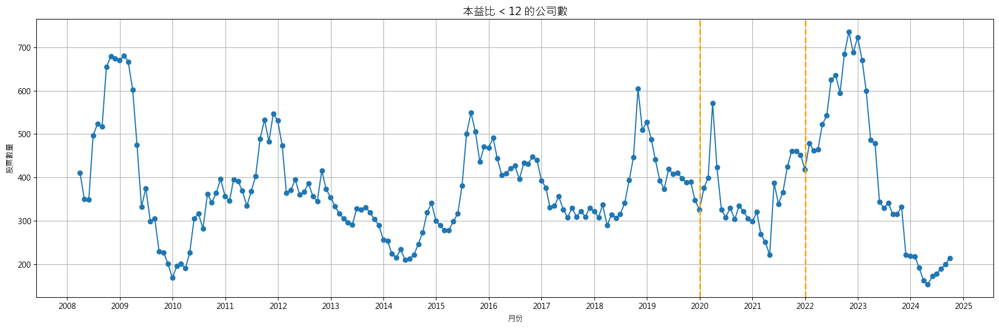

In [ ]:
low_pe_counts = (daily_pe_resample < 12).sum(axis=1)

plt.figure(figsize=(18, 6))
plt.plot(low_pe_counts.index, low_pe_counts.values, marker='o')
plt.title('本益比 < 12 的公司數', fontsize=14)
plt.xlabel('月份')
plt.ylabel('股票數量')
plt.grid(True)

plt.gca().xaxis.set_major_locator(mdates.YearLocator())
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

# 標記出 2020、2022之間
plt.axvline(pd.to_datetime('2020-01-01'), color='orange', linestyle='--', linewidth=2)
plt.axvline(pd.to_datetime('2022-01-01'), color='orange', linestyle='--', linewidth=2)


# plt.xticks(rotation=90)
plt.tight_layout()

plt.show()

---

## 看入選股數比較少的時候震盪會不會比較大

In [ ]:
# rep_all_cond_MDD = rep_all_cond.calc_dd(rep_all_cond.stock_data['portfolio_returns'])*100
# rep_all_cond_and_pe_MDD = rep_all_cond_and_pe_daily.calc_dd(rep_all_cond_and_pe_daily.stock_data['portfolio_returns'])*100

In [ ]:
# plt.figure(figsize=(12, 6))

# plt.plot(rep_all_cond_MDD.index, rep_all_cond_MDD.values, label='無本益比條件')
# plt.plot(rep_all_cond_and_pe_MDD.index, rep_all_cond_and_pe_MDD.values, label='有本益比條件', alpha=0.7)

# plt.title('比較有無本益比條件進出場的 MDD 變化', fontsize=16)
# plt.xlabel('年份')
# plt.ylabel('MDD (%)')

# plt.legend(fontsize=14)
# plt.grid()

# plt.gca().xaxis.set_major_locator(mdates.YearLocator())
# plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

# # plt.xticks(rotation=90)

# plt.tight_layout()
# plt.show()

---